In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [1]:
%load_ext tensorboard

In [3]:
import tensorflow as tf
import os
import random
import numpy as np

from glob import glob

from tqdm import tqdm

from skimage.io import imread, imshow
from skimage.transform import resize
import matplotlib.pyplot as plt

import datetime

In [4]:
seed =42
np.random.seed = seed

IMG_WIDTH = 224
IMG_HEIGHT = 224
IMG_CHANNELS = 3 

In [5]:
TRAIN_PATH='/content/drive/My Drive/DATASET/dataset3/train'
TEST_PATH='/content/drive/My Drive/DATASET/dataset3/test'

train_ids = np.array(sorted(glob(TRAIN_PATH+'/images/*.jpg')))

train_m_ids = np.array(sorted(glob(TRAIN_PATH +'/masks/*.tiff')))

test_ids = np.array(sorted(glob(TEST_PATH+'/images/*.jpg')) )

print('nbr d image d entrainement:')
print(len(train_ids))

print('nbr de masks:')
print(len(train_m_ids))

print('nbr d images test:')
print(len(test_ids))

nbr d image d entrainement:
2006
nbr de masks:
2006
nbr d images test:
10


In [6]:
import glob
import cv2

**mask + image resizing**

In [7]:
X_train = np.zeros ((len(train_ids),IMG_HEIGHT,IMG_WIDTH , IMG_CHANNELS), dtype=np.uint8)


path = '/content/drive/My Drive/DATASET/dataset3/train/images/*'


from google.colab.patches import cv2_imshow

i = 0
 # sorted by name
for file in sorted(glob.glob(path)):
  a= cv2.imread(file)
  c = cv2.cvtColor(a, cv2.COLOR_BGR2RGB)
  b= resize (c, (IMG_HEIGHT,IMG_WIDTH), mode='constant', preserve_range=True)
  X_train[i]= b
  i = i + 1



In [8]:
Y_train = np.zeros(( len(train_ids),IMG_HEIGHT,IMG_WIDTH, 1 ),dtype=np.bool)

path = '/content/drive/My Drive/DATASET/dataset3/train/masks/*'



i = 0
for file in sorted(glob.glob(path)):
  a= cv2.imread(file, cv2.IMREAD_GRAYSCALE)
  # define a threshold, 128 is the middle of black and white in grey scale
  thresh = 128
  img_binary = cv2.threshold(a, thresh, 255, cv2.THRESH_BINARY)[1]
  b= np.expand_dims(resize (img_binary, (224,224), mode='constant', preserve_range=True),axis=-1)
  Y_train[i] = b
  i = i + 1
  print(file)

/content/drive/My Drive/DATASET/dataset3/train/masks/1.tiff
/content/drive/My Drive/DATASET/dataset3/train/masks/10.tiff
/content/drive/My Drive/DATASET/dataset3/train/masks/100.tiff
/content/drive/My Drive/DATASET/dataset3/train/masks/100_0_2233.tiff
/content/drive/My Drive/DATASET/dataset3/train/masks/100_0_2751.tiff
/content/drive/My Drive/DATASET/dataset3/train/masks/100_0_5328.tiff
/content/drive/My Drive/DATASET/dataset3/train/masks/100_0_9574.tiff
/content/drive/My Drive/DATASET/dataset3/train/masks/101.tiff
/content/drive/My Drive/DATASET/dataset3/train/masks/101_0_2503.tiff
/content/drive/My Drive/DATASET/dataset3/train/masks/101_0_4998.tiff
/content/drive/My Drive/DATASET/dataset3/train/masks/101_0_569.tiff
/content/drive/My Drive/DATASET/dataset3/train/masks/101_0_5902.tiff
/content/drive/My Drive/DATASET/dataset3/train/masks/101_0_5936.tiff
/content/drive/My Drive/DATASET/dataset3/train/masks/101_0_5970.tiff
/content/drive/My Drive/DATASET/dataset3/train/masks/101_0_6611.ti

**test images resizing**

In [9]:
#test images

X_test = np.zeros ((len(test_ids),IMG_HEIGHT,IMG_WIDTH , IMG_CHANNELS), dtype=np.uint8)


path = '/content/drive/My Drive/DATASET/dataset3/test/images/*'


from google.colab.patches import cv2_imshow

i = 0
 # sorted by name
for file in sorted(glob.glob(path)):
  a= cv2.imread(file)
  c = cv2.cvtColor(a, cv2.COLOR_BGR2RGB)
  b= resize (c, (IMG_HEIGHT,IMG_WIDTH), mode='constant', preserve_range=True)
  X_test[i]= b
  i = i + 1
  print(str(file))

/content/drive/My Drive/DATASET/dataset3/test/images/1.jpg
/content/drive/My Drive/DATASET/dataset3/test/images/10.jpg
/content/drive/My Drive/DATASET/dataset3/test/images/2.jpg
/content/drive/My Drive/DATASET/dataset3/test/images/3.jpg
/content/drive/My Drive/DATASET/dataset3/test/images/4.jpg
/content/drive/My Drive/DATASET/dataset3/test/images/5.jpg
/content/drive/My Drive/DATASET/dataset3/test/images/6.jpg
/content/drive/My Drive/DATASET/dataset3/test/images/7.jpg
/content/drive/My Drive/DATASET/dataset3/test/images/8.jpg
/content/drive/My Drive/DATASET/dataset3/test/images/9.jpg


In [10]:
Y_test = np.zeros(( len(test_ids),IMG_HEIGHT,IMG_WIDTH, 1 ),dtype=np.bool)

path = '/content/drive/My Drive/DATASET/dataset3/test/masks/*'

i = 0
for file in sorted(glob.glob(path)):
  a= cv2.imread(file, cv2.IMREAD_GRAYSCALE)
  # define a threshold, 128 is the middle of black and white in grey scale
  thresh = 128
  img_binary = cv2.threshold(a, thresh, 255, cv2.THRESH_BINARY)[1]
  b= np.expand_dims(resize (img_binary, (224,224), mode='constant', preserve_range=True),axis=-1)
  Y_test[i] = b
  i = i + 1
  print(file)

/content/drive/My Drive/DATASET/dataset3/test/masks/1.tiff
/content/drive/My Drive/DATASET/dataset3/test/masks/10.tiff
/content/drive/My Drive/DATASET/dataset3/test/masks/2.tiff
/content/drive/My Drive/DATASET/dataset3/test/masks/3.tiff
/content/drive/My Drive/DATASET/dataset3/test/masks/4.tiff
/content/drive/My Drive/DATASET/dataset3/test/masks/5.tiff
/content/drive/My Drive/DATASET/dataset3/test/masks/6.tiff
/content/drive/My Drive/DATASET/dataset3/test/masks/7.tiff
/content/drive/My Drive/DATASET/dataset3/test/masks/8.tiff
/content/drive/My Drive/DATASET/dataset3/test/masks/9.tiff


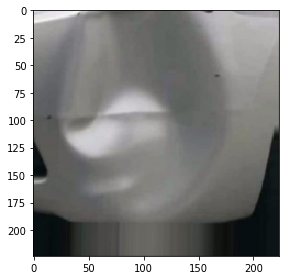

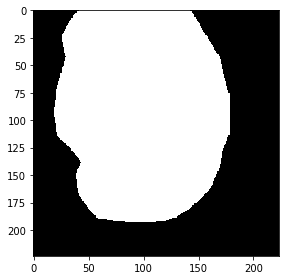

In [11]:
imshow(X_train[888])
plt.show()
imshow(np.squeeze(Y_train[888]))
plt.show()

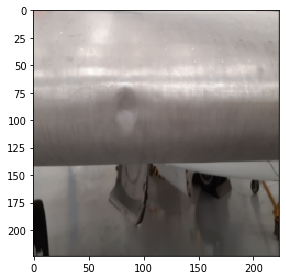

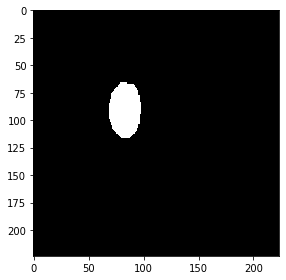

In [12]:
imshow(X_test[0])
plt.show()
imshow(np.squeeze(Y_test[0]))
plt.show()

build the model

In [13]:
#DropBlock1D
import keras
import keras.backend as K


class DropBlock1D(keras.layers.Layer):
    """See: https://arxiv.org/pdf/1810.12890.pdf"""

    def __init__(self,
                 block_size,
                 keep_prob,
                 sync_channels=False,
                 data_format=None,
                 **kwargs):
        """Initialize the layer.
        :param block_size: Size for each mask block.
        :param keep_prob: Probability of keeping the original feature.
        :param sync_channels: Whether to use the same dropout for all channels.
        :param data_format: 'channels_first' or 'channels_last' (default).
        :param kwargs: Arguments for parent class.
        """
        super(DropBlock1D, self).__init__(**kwargs)
        self.block_size = block_size
        self.keep_prob = keep_prob
        self.sync_channels = sync_channels
        self.data_format = K.normalize_data_format(data_format)
        self.input_spec = keras.engine.base_layer.InputSpec(ndim=3)
        self.supports_masking = True

    def get_config(self):
        config = {'block_size': self.block_size,
                  'keep_prob': self.keep_prob,
                  'sync_channels': self.sync_channels,
                  'data_format': self.data_format}
        base_config = super(DropBlock1D, self).get_config()
        return dict(list(base_config.items()) + list(config.items()))

    def compute_mask(self, inputs, mask=None):
        return mask

    def compute_output_shape(self, input_shape):
        return input_shape

    def _get_gamma(self, feature_dim):
        """Get the number of activation units to drop"""
        feature_dim = K.cast(feature_dim, K.floatx())
        block_size = K.constant(self.block_size, dtype=K.floatx())
        return ((1.0 - self.keep_prob) / block_size) * (feature_dim / (feature_dim - block_size + 1.0))

    def _compute_valid_seed_region(self, seq_length):
        positions = K.arange(seq_length)
        half_block_size = self.block_size // 2
        valid_seed_region = K.switch(
            K.all(
                K.stack(
                    [
                        positions >= half_block_size,
                        positions < seq_length - half_block_size,
                    ],
                    axis=-1,
                ),
                axis=-1,
            ),
            K.ones((seq_length,)),
            K.zeros((seq_length,)),
        )
        return K.expand_dims(K.expand_dims(valid_seed_region, axis=0), axis=-1)

    def _compute_drop_mask(self, shape):
        seq_length = shape[1]
        mask = K.random_binomial(shape, p=self._get_gamma(seq_length))
        mask *= self._compute_valid_seed_region(seq_length)
        mask = keras.layers.MaxPool1D(
            pool_size=self.block_size,
            padding='same',
            strides=1,
            data_format='channels_last',
        )(mask)
        return 1.0 - mask

    def call(self, inputs, training=None):

        def dropped_inputs():
            outputs = inputs
            if self.data_format == 'channels_first':
                outputs = K.permute_dimensions(outputs, [0, 2, 1])
            shape = K.shape(outputs)
            if self.sync_channels:
                mask = self._compute_drop_mask([shape[0], shape[1], 1])
            else:
                mask = self._compute_drop_mask(shape)
            outputs = outputs * mask *\
                (K.cast(K.prod(shape), dtype=K.floatx()) / K.sum(mask))
            if self.data_format == 'channels_first':
                outputs = K.permute_dimensions(outputs, [0, 2, 1])
            return outputs

        return K.in_train_phase(dropped_inputs, inputs, training=training)


class DropBlock2D(keras.layers.Layer):
    """See: https://arxiv.org/pdf/1810.12890.pdf"""

    def __init__(self,
                 block_size,
                 keep_prob,
                 sync_channels=False,
                 data_format=None,
                 **kwargs):
        """Initialize the layer.
        :param block_size: Size for each mask block.
        :param keep_prob: Probability of keeping the original feature.
        :param sync_channels: Whether to use the same dropout for all channels.
        :param data_format: 'channels_first' or 'channels_last' (default).
        :param kwargs: Arguments for parent class.
        """
        super(DropBlock2D, self).__init__(**kwargs)
        self.block_size = block_size
        self.keep_prob = keep_prob
        self.sync_channels = sync_channels
        self.data_format = K.normalize_data_format(data_format)
        self.input_spec = keras.engine.base_layer.InputSpec(ndim=4)
        self.supports_masking = True

    def get_config(self):
        config = {'block_size': self.block_size,
                  'keep_prob': self.keep_prob,
                  'sync_channels': self.sync_channels,
                  'data_format': self.data_format}
        base_config = super(DropBlock2D, self).get_config()
        return dict(list(base_config.items()) + list(config.items()))

    def compute_mask(self, inputs, mask=None):
        return mask

    def compute_output_shape(self, input_shape):
        return input_shape

    def _get_gamma(self, height, width):
        """Get the number of activation units to drop"""
        height, width = K.cast(height, K.floatx()), K.cast(width, K.floatx())
        block_size = K.constant(self.block_size, dtype=K.floatx())
        return ((1.0 - self.keep_prob) / (block_size ** 2)) *\
               (height * width / ((height - block_size + 1.0) * (width - block_size + 1.0)))

    def _compute_valid_seed_region(self, height, width):
        positions = K.concatenate([
            K.expand_dims(K.tile(K.expand_dims(K.arange(height), axis=1), [1, width]), axis=-1),
            K.expand_dims(K.tile(K.expand_dims(K.arange(width), axis=0), [height, 1]), axis=-1),
        ], axis=-1)
        half_block_size = self.block_size // 2
        valid_seed_region = K.switch(
            K.all(
                K.stack(
                    [
                        positions[:, :, 0] >= half_block_size,
                        positions[:, :, 1] >= half_block_size,
                        positions[:, :, 0] < height - half_block_size,
                        positions[:, :, 1] < width - half_block_size,
                    ],
                    axis=-1,
                ),
                axis=-1,
            ),
            K.ones((height, width)),
            K.zeros((height, width)),
        )
        return K.expand_dims(K.expand_dims(valid_seed_region, axis=0), axis=-1)

    def _compute_drop_mask(self, shape):
        height, width = shape[1], shape[2]
        mask = K.random_binomial(shape, p=self._get_gamma(height, width))
        mask *= self._compute_valid_seed_region(height, width)
        mask = keras.layers.MaxPool2D(
            pool_size=(self.block_size, self.block_size),
            padding='same',
            strides=1,
            data_format='channels_last',
        )(mask)
        return 1.0 - mask

    def call(self, inputs, training=None):

        def dropped_inputs():
            outputs = inputs
            if self.data_format == 'channels_first':
                outputs = K.permute_dimensions(outputs, [0, 2, 3, 1])
            shape = K.shape(outputs)
            if self.sync_channels:
                mask = self._compute_drop_mask([shape[0], shape[1], shape[2], 1])
            else:
                mask = self._compute_drop_mask(shape)
            outputs = outputs * mask *\
                (K.cast(K.prod(shape), dtype=K.floatx()) / K.sum(mask))
            if self.data_format == 'channels_first':
                outputs = K.permute_dimensions(outputs, [0, 3, 1, 2])
            return outputs

        return K.in_train_phase(dropped_inputs, inputs, training=training)

In [14]:
from keras.layers import GlobalAveragePooling2D, GlobalMaxPooling2D, Reshape, Dense, multiply, Permute, Concatenate, \
    Conv2D, Add, Activation, Lambda,Conv1D, Input

def spatial_attention(input_feature):
    kernel_size = 7

    if K.image_data_format() == "channels_first":
        channel = input_feature.shape[1]
        cbam_feature = Permute((2, 3, 1))(input_feature)
    else:
        channel = input_feature.shape[-1]
        cbam_feature = input_feature

    avg_pool = Lambda(lambda x: K.mean(x, axis=3, keepdims=True))(cbam_feature)
    assert avg_pool.shape[-1] == 1
    max_pool = Lambda(lambda x: K.max(x, axis=3, keepdims=True))(cbam_feature)
    assert max_pool.shape[-1] == 1
    concat = Concatenate(axis=3)([avg_pool, max_pool])
    assert concat.shape[-1] == 2
    cbam_feature = Conv2D(filters=1,
                          kernel_size=kernel_size,
                          strides=1,
                          padding='same',
                          activation='sigmoid',
                          kernel_initializer='he_normal',
                          use_bias=False)(concat)
    assert cbam_feature.shape[-1] == 1

    if K.image_data_format() == "channels_first":
        cbam_feature = Permute((3, 1, 2))(cbam_feature)

    return multiply([input_feature, cbam_feature])

In [15]:
from tensorflow.keras.layers import Conv2D, BatchNormalization, Activation, MaxPool2D, Conv2DTranspose, Concatenate, Input
from tensorflow.keras.models import Model
from tensorflow.keras.applications import VGG19

def conv_block(input, num_filters):
    x = Conv2D(num_filters, 3, padding="same")(input)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
    
    x = Conv2D(num_filters, 3, padding="same")(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    return x

def decoder_block(input, skip_features, num_filters):
    x = Conv2DTranspose(num_filters, (2, 2), strides=2, padding="same")(input)
    x = spatial_attention(x)
    x = Concatenate()([x, skip_features])
    x = conv_block(x, num_filters)
    return x

def build_vgg19_unet(input_shape):
    """ Input """
    inputs = Input(input_shape)

    """ Pre-trained VGG19 Model """
    vgg19 = VGG19(include_top=False, weights="imagenet", input_tensor=inputs)
    vgg19.trainable = False
    """ Encoder """
    s1 =vgg19.get_layer("block1_conv2").output
    s2 = vgg19.get_layer("block2_conv2").output         ## (256 x 256)
    s3 = vgg19.get_layer("block3_conv4").output         ## (128 x 128)
    s4 = vgg19.get_layer("block4_conv4").output         ## (64 x 64)
    """ Bridge """
    b1 = vgg19.get_layer("block5_conv4").output         ## (32 x 32)
    b1 = spatial_attention(b1)
    """ Decoder """
    d1 = decoder_block(b1, s4, 512)  
    d1 = spatial_attention(d1)
    d2 = decoder_block(d1, s3, 256)                     ## (128 x 128)
    d3 = decoder_block(d2, s2, 128)                     ## (256 x 256)
    d4 = decoder_block(d3, s1, 64)                      ## (512 x 512)

    """ Output """
    outputs = Conv2D(1, 1, padding="same", activation="sigmoid")(d4)

    model = Model(inputs, outputs, name="VGG19_U-Net")
    model.compile(optimizer='adam', loss='binary_crossentropy',metrics=['accuracy','Recall', 'Precision', tf.keras.metrics.MeanIoU(num_classes=2)])

    return model

if __name__ == "__main__":
    input_shape = (224, 224, 3)
    model = build_vgg19_unet(input_shape)
    model.summary()

80150528/80134624 [==============================] - 1s 0us/step
Model: "VGG19_U-Net"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
block1_conv1 (Conv2D)           (None, 224, 224, 64) 1792        input_1[0][0]                    
__________________________________________________________________________________________________
block1_conv2 (Conv2D)           (None, 224, 224, 64) 36928       block1_conv1[0][0]               
__________________________________________________________________________________________________
block1_pool (MaxPooling2D)      (None, 112, 112, 64) 0           block1_conv2[0][0]               
_______________________

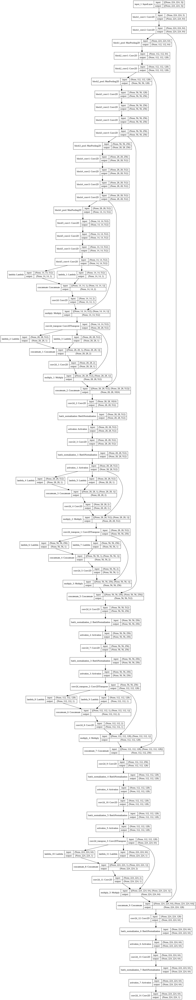

In [16]:
tf.keras.utils.plot_model(model, show_shapes=True)


trainning

In [17]:
checkpointer = tf.keras.callbacks.ModelCheckpoint('model_for_dents.h5', verbose=1, save_best_only=False )

callbacks = [
        tf.keras.callbacks.EarlyStopping(patience=10, monitor='val_loss'),
        tf.keras.callbacks.TensorBoard(log_dir='logs'),m
        checkpointer]

results = model.fit(X_train, Y_train, validation_split=0.1, batch_size=8, epochs= 150, callbacks=callbacks )

/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 1/150
226/226 [==============================] - 242s 877ms/step - loss: 0.2608 - accuracy: 0.9114 - recall: 0.0952 - precision: 0.3368 - mean_io_u: 0.4595 - val_loss: 0.2258 - val_accuracy: 0.8960 - val_recall: 0.6333 - val_precision: 0.1507 - val_mean_io_u: 0.4868

Epoch 00001: saving model to model_for_dents.h5
Epoch 2/150
226/226 [==============================] - 176s 778ms/step - loss: 0.1600 - accuracy: 0.9407 - recall: 0.4571 - precision: 0.7084 - mean_io_u: 0.4595 - val_loss: 0.0741 - val_accuracy: 0.9744 - val_recall: 0.4350 - val_precision: 0.5191 - val_mean_io_u: 0.4868

Epoch 00002: saving model to model_for_dents.h5
Epoch 3/150
226/226 [==============================] - 177s 784ms/step - loss: 0.1166 - accuracy: 0.9565 - recall: 0.6571 - precision: 0.7722 - mean_io_u: 0.4595 - val_loss: 0.2108 - val_accuracy: 0.9106 - val_recall: 0.8022 - val_precision: 0.2012 - val_mean_io_u: 0.4868

Epoch 00003: saving model to model_for_dents.h5
Epoch 4/150
226/226 [=============

**fine turning**

In [18]:
initial_epochs= 10
history = model.fit(X_train,Y_train, epochs= initial_epochs )
model.trainable = True
print("Number of layers in the base model: ", len(model.layers))

fine_tune_at = 100

# Freeze all the layers before the `fine_tune_at` layer
for layer in model.layers[:fine_tune_at]:
  layer.trainable =  False

fine_tune_epochs = 15
total_epochs =  initial_epochs + fine_tune_epochs

history_fine = model.fit(X_train,Y_train,epochs=total_epochs,initial_epoch=history.epoch[-1])


Epoch 1/12
63/63 [==============================] - 188s 3s/step - loss: 0.0159 - accuracy: 0.9942 - recall: 0.9576 - precision: 0.9656 - mean_io_u: 0.4669
Epoch 2/12
63/63 [==============================] - 141s 2s/step - loss: 0.0110 - accuracy: 0.9957 - recall: 0.9698 - precision: 0.9726 - mean_io_u: 0.4759
Epoch 3/12
63/63 [==============================] - 141s 2s/step - loss: 0.0096 - accuracy: 0.9961 - recall: 0.9739 - precision: 0.9747 - mean_io_u: 0.4837
Epoch 4/12
63/63 [==============================] - 141s 2s/step - loss: 0.0088 - accuracy: 0.9964 - recall: 0.9758 - precision: 0.9765 - mean_io_u: 0.4887
Epoch 5/12
63/63 [==============================] - 141s 2s/step - loss: 0.0082 - accuracy: 0.9966 - recall: 0.9775 - precision: 0.9778 - mean_io_u: 0.4947
Epoch 6/12
63/63 [==============================] - 141s 2s/step - loss: 0.0079 - accuracy: 0.9967 - recall: 0.9786 - precision: 0.9779 - mean_io_u: 0.5008
Epoch 7/12
63/63 [==============================] - 141s 2s/step

In [19]:
%tensorboard --logdir logs/fit

<IPython.core.display.Javascript object>

In [20]:
acc = history.history['recall']
val_acc = history.history['recall']

loss = history.history['loss']
val_loss = history.history['loss']

acc += history_fine.history['recall']
val_acc += history_fine.history['recall']

loss += history_fine.history['loss']
val_loss += history_fine.history['loss']

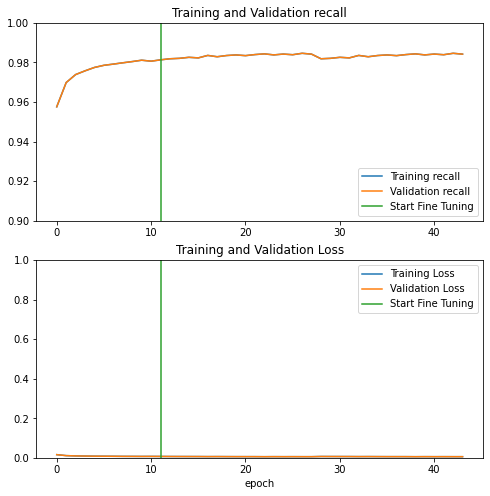

In [21]:
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training recall')
plt.plot(val_acc, label='Validation recall')
plt.ylim([0.9, 1])
plt.plot([initial_epochs-1,initial_epochs-1],
          plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='lower right')
plt.title('Training and Validation recall')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.ylim([0, 1.0])
plt.plot([initial_epochs-1,initial_epochs-1],
         plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

1/1 [==============================] - 8s 8s/step


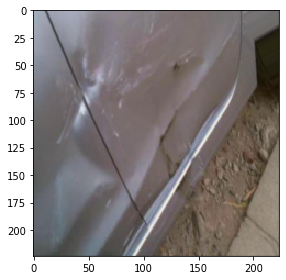

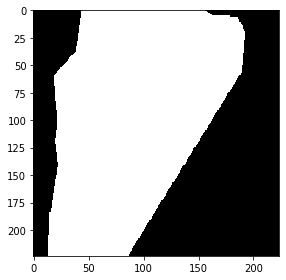

/usr/local/lib/python3.7/dist-packages/skimage/io/_plugins/matplotlib_plugin.py:150: UserWarning: Low image data range; displaying image with stretched contrast.
  lo, hi, cmap = _get_display_range(image)


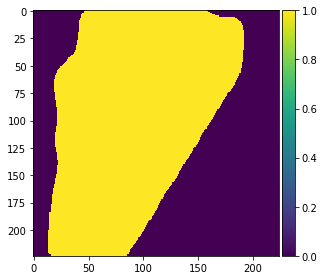

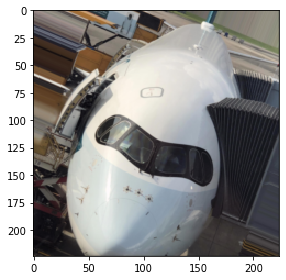

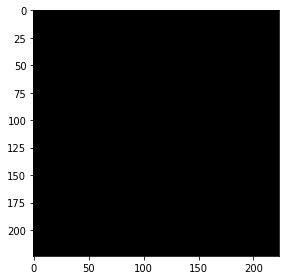

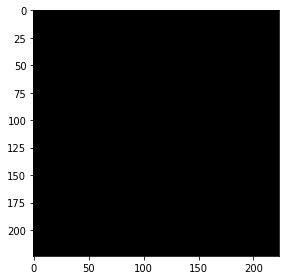

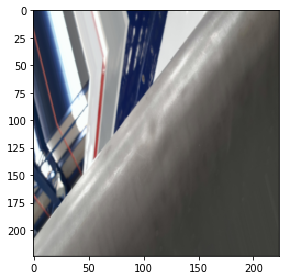

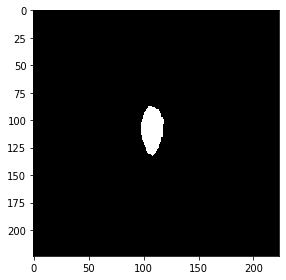

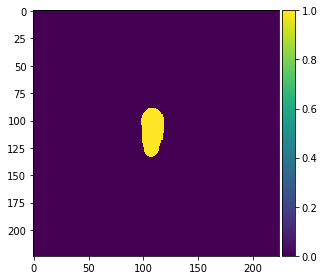

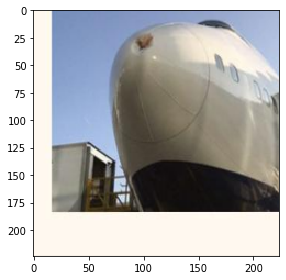

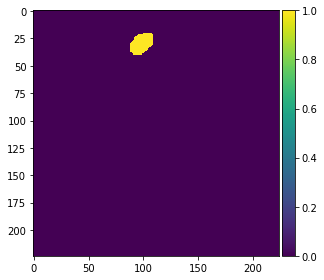

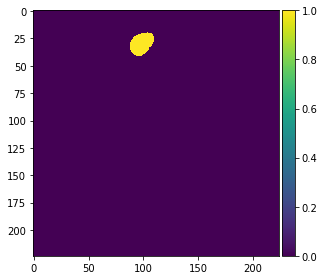

In [22]:
idx = random.randint(0, len(X_train))


preds_train = model.predict(X_train[:int(X_train.shape[0]*0.9)], verbose=1)
preds_val = model.predict(X_train[int(X_train.shape[0]*0.9):], verbose=1)
preds_test = model.predict(X_test, verbose=1)

 
preds_train_t = (preds_train > 0.5).astype(np.uint8)
preds_val_t = (preds_val > 0.5).astype(np.uint8)
preds_test_t = (preds_test > 0.5).astype(np.uint8)


# Perform a sanity check on some random training samples
ix = random.randint(0, len(preds_train_t))
imshow(X_train[ix])
plt.show()
imshow(np.squeeze(Y_train[ix]))
plt.show()
imshow(np.squeeze(preds_train_t[ix]))
plt.show()

# Perform a sanity check on some random validation samples
ix = random.randint(0, len(preds_val_t))
imshow(X_train[int(X_train.shape[0]*0.9):][ix])
plt.show()
imshow(np.squeeze(Y_train[int(Y_train.shape[0]*0.9):][ix]))
plt.show()
imshow(np.squeeze(preds_val_t[ix]))
plt.show()

# Perform a sanity check on some random validation samples
ix = random.randint(0, len(preds_val_t))
imshow(X_train[int(X_train.shape[0]*0.9):][ix])
plt.show()
imshow(np.squeeze(Y_train[int(Y_train.shape[0]*0.9):][ix]))
plt.show()
imshow(np.squeeze(preds_val_t[ix]))
plt.show()

# Perform a sanity check on some random validation samples
ix = random.randint(0, len(preds_val_t))
imshow(X_train[int(X_train.shape[0]*0.9):][ix])
plt.show()
imshow(np.squeeze(Y_train[int(Y_train.shape[0]*0.9):][ix]))
plt.show()
imshow(np.squeeze(preds_val_t[ix]))
plt.show()


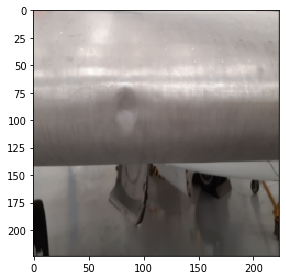

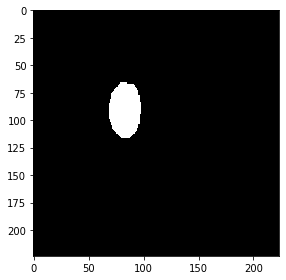

/usr/local/lib/python3.7/dist-packages/skimage/io/_plugins/matplotlib_plugin.py:150: UserWarning: Low image data range; displaying image with stretched contrast.
  lo, hi, cmap = _get_display_range(image)


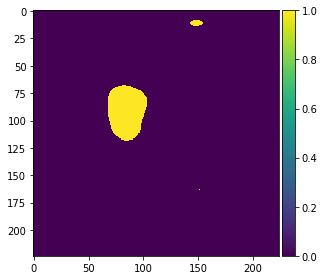

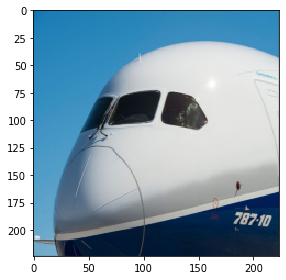

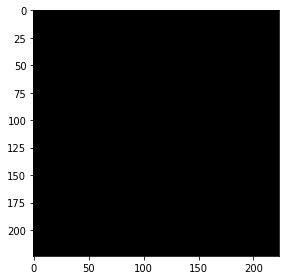

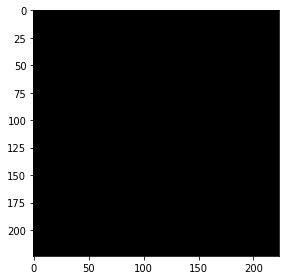

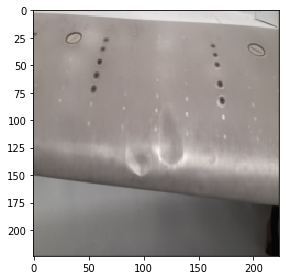

...

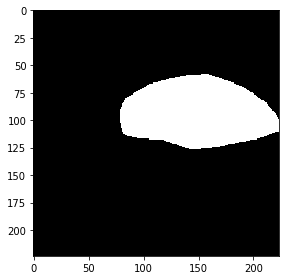

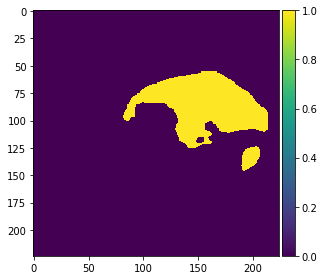

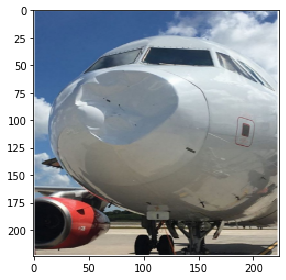

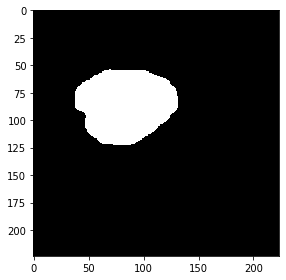

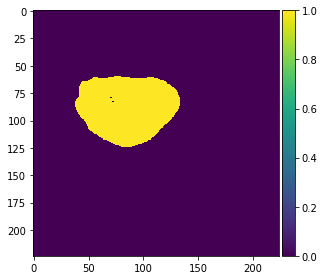

In [23]:
# Perform a sanity check on some random testing samples
ix = 0
imshow(X_test[ix])
plt.show()
imshow(np.squeeze(Y_test[ix]))
plt.show()
#imshow(np.squeeze(Y_train[int(Y_train.shape[0]*0.9):][ix]))
#plt.show()
imshow(np.squeeze(preds_test_t[ix]))
plt.show()

# Perform a sanity check on some random testing samples
ix = 1
imshow(X_test[ix])
plt.show()
imshow(np.squeeze(Y_test[ix]))
plt.show()
#imshow(np.squeeze(Y_train[int(Y_train.shape[0]*0.9):][ix]))
#plt.show()
imshow(np.squeeze(preds_test_t[ix]))
plt.show()

# Perform a sanity check on some random testing samples
ix = 2
imshow(X_test[ix])
plt.show()
imshow(np.squeeze(Y_test[ix]))
plt.show()
#imshow(np.squeeze(Y_train[int(Y_train.shape[0]*0.9):][ix]))
#plt.show()
imshow(np.squeeze(preds_test_t[ix]))
plt.show()

# Perform a sanity check on some random testing samples
ix = 3
imshow(X_test[ix])
plt.show()
imshow(np.squeeze(Y_test[ix]))
plt.show()
#imshow(np.squeeze(Y_train[int(Y_train.shape[0]*0.9):][ix]))
#plt.show()
imshow(np.squeeze(preds_test_t[ix]))
plt.show()

# Perform a sanity check on some random testing samples
ix = 4
imshow(X_test[ix])
plt.show()
imshow(np.squeeze(Y_test[ix]))
plt.show()
#imshow(np.squeeze(Y_train[int(Y_train.shape[0]*0.9):][ix]))
#plt.show()
imshow(np.squeeze(preds_test_t[ix]))
plt.show()

# Perform a sanity check on some random testing samples
ix = 5
imshow(X_test[ix])
plt.show()
imshow(np.squeeze(Y_test[ix]))
plt.show()
#imshow(np.squeeze(Y_train[int(Y_train.shape[0]*0.9):][ix]))
#plt.show()
imshow(np.squeeze(preds_test_t[ix]))
plt.show()

# Perform a sanity check on some random testing samples
ix = 6
imshow(X_test[ix])
plt.show()
imshow(np.squeeze(Y_test[ix]))
plt.show()
#imshow(np.squeeze(Y_train[int(Y_train.shape[0]*0.9):][ix]))
#plt.show()
imshow(np.squeeze(preds_test_t[ix]))
plt.show()

# Perform a sanity check on some random testing samples
ix = 7
imshow(X_test[ix])
plt.show()
imshow(np.squeeze(Y_test[ix]))
plt.show()
#imshow(np.squeeze(Y_train[int(Y_train.shape[0]*0.9):][ix]))
#plt.show()
imshow(np.squeeze(preds_test_t[ix]))
plt.show()

# Perform a sanity check on some random testing samples
ix = 8
imshow(X_test[ix])
plt.show()
imshow(np.squeeze(Y_test[ix]))
plt.show()
#imshow(np.squeeze(Y_train[int(Y_train.shape[0]*0.9):][ix]))
#plt.show()
imshow(np.squeeze(preds_test_t[ix]))
plt.show()

# Perform a sanity check on some random testing samples
ix = 9
imshow(X_test[ix])
plt.show()
imshow(np.squeeze(Y_test[ix]))
plt.show()
#imshow(np.squeeze(Y_train[int(Y_train.shape[0]*0.9):][ix]))
#plt.show()
imshow(np.squeeze(preds_test_t[ix]))
plt.show()




In [24]:
# Save our model as saved_model format
!mkdir -p saved_model
model.save('saved_model/my_model')

INFO:tensorflow:Assets written to: saved_model/my_model/assets


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


In [25]:
# Covert to Tensorflow Lite format 
converter = tf.lite.TFLiteConverter.from_saved_model('saved_model/my_model')
tflite_model = converter.convert()
open("Unet_testmodel.tflite", "wb").write(tflite_model)

124686876

In [26]:
model.evaluate(X_test, Y_test, return_dict= True)

1/1 [==============================] - 0s 442ms/step - loss: 0.0916 - accuracy: 0.9829 - recall: 0.8050 - precision: 0.8237 - mean_io_u: 0.5425


{'accuracy': 0.9829480051994324,
 'loss': 0.09155324846506119,
 'mean_io_u': 0.5425480008125305,
 'precision': 0.8236767053604126,
 'recall': 0.8050057888031006}

In [27]:
m = tf.keras.metrics.Recall()
m.update_state( Y_test, preds_test, sample_weight=None)
m.result().numpy()

0.8050058

In [28]:
m = tf.keras.metrics.Precision()
m.update_state( Y_test, preds_test, sample_weight=None)
m.result().numpy()

0.8236767

In [29]:
m = tf.keras.metrics.BinaryAccuracy()
m.update_state( Y_test, preds_test, sample_weight=None)
m.result().numpy()

0.982948

In [30]:
m = tf.keras.metrics.MeanIoU(num_classes=2)
m.update_state( Y_test, preds_test, sample_weight=None)
m.result().numpy()

0.542548

remarque à vérifier : Unet moins 572 as size of images